In [1]:
%matplotlib inline
# load and show an image with Pillow
from PIL import Image
# load the image
from IPython.display import display # to display images
from matplotlib import pyplot as plt # to display images
from matplotlib.pyplot import figure
import numpy as np


In [2]:
x1 = np.arange(1,5).reshape((2, 2))
x2 = np.arange(5,9).reshape((2, 2))
display('x1',x1)
display('x2',x2)
#Matrix Multiplication
print('Matrix Multiplication (np.matmul) result:\n',np.matmul(x1, x2))

#Element-Wise Matrix Multiplication
print('Element-Wise Matrix Multiplication (np.multiply) result:\n',np.multiply(x1, x2))



'x1'

array([[1, 2],
       [3, 4]])

'x2'

array([[5, 6],
       [7, 8]])

Matrix Multiplication (np.matmul) result:
 [[19 22]
 [43 50]]
Element-Wise Matrix Multiplication (np.multiply) result:
 [[ 5 12]
 [21 32]]


In [3]:
#@title Reminder2: Padding with Zero 
print('Original Matrix\n',x1)
padded = np.zeros(shape=(x1.shape[0]+2,x1.shape[0]+2))
padded[1:3,1:3]=x1
print('Padded Matrix\n',padded)


Original Matrix
 [[1 2]
 [3 4]]
Padded Matrix
 [[0. 0. 0. 0.]
 [0. 1. 2. 0.]
 [0. 3. 4. 0.]
 [0. 0. 0. 0.]]


image.format:  JPEG
image mode:  RGB
Image size:  (2064, 1410)
Image shape: (1410, 2064, 3)


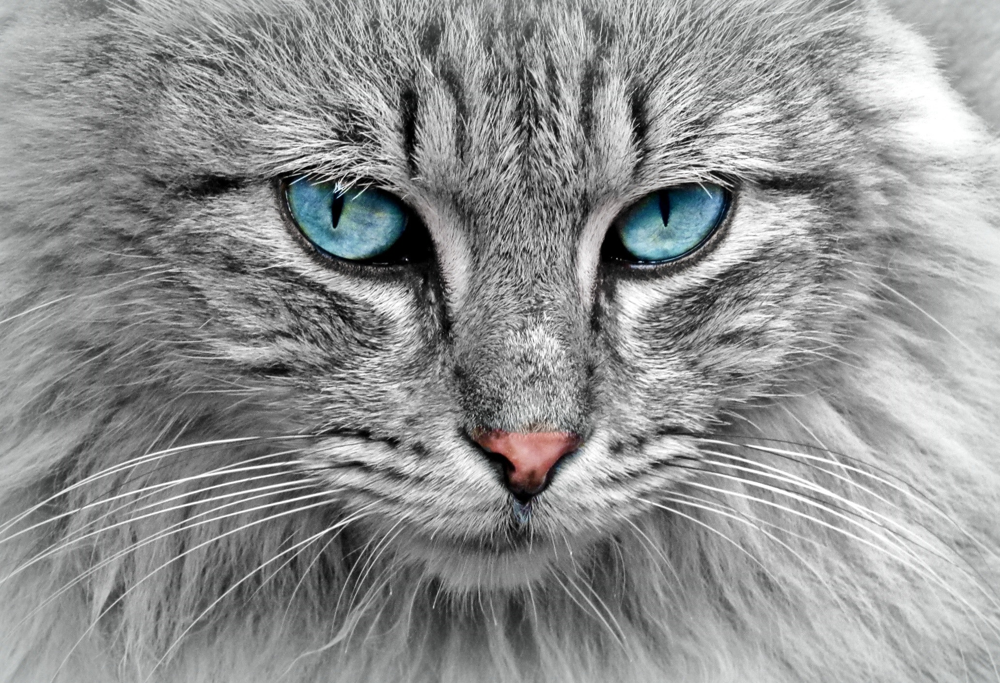

In [4]:
#@title Load Image
fileName = "cat.png" #@param {type:"string"}
image = Image.open(fileName)
# summarize some details about the image
print('image.format: ', image.format)
print('image mode: ', image.mode)
print('Image size: ',image.size)
imageMatrix=np.array(image)
print('Image shape:', imageMatrix.shape)
# show the image
display(image)


In [5]:
imageMatrix=np.array(image)


In [6]:
print(imageMatrix.shape)


(1410, 2064, 3)


In [7]:
imageMatrix = np.transpose(imageMatrix, (2,0,1))
imageMatrix.shape


(3, 1410, 2064)

In [8]:
imageMatrix


array([[[184, 188, 190, ..., 193, 197, 193],
        [187, 187, 186, ..., 195, 193, 189],
        [186, 186, 186, ..., 194, 193, 195],
        ...,
        [188, 191, 191, ..., 185, 194, 204],
        [191, 191, 192, ..., 177, 191, 203],
        [191, 191, 192, ..., 175, 188, 200]],

       [[189, 192, 194, ..., 195, 199, 195],
        [191, 191, 190, ..., 197, 195, 191],
        [190, 190, 190, ..., 196, 195, 197],
        ...,
        [193, 196, 196, ..., 189, 199, 209],
        [195, 195, 196, ..., 181, 195, 207],
        [195, 195, 196, ..., 179, 192, 204]],

       [[185, 191, 193, ..., 194, 198, 192],
        [190, 190, 189, ..., 196, 194, 190],
        [189, 189, 189, ..., 195, 194, 196],
        ...,
        [189, 192, 192, ..., 188, 195, 205],
        [194, 194, 195, ..., 180, 194, 206],
        [194, 194, 195, ..., 178, 191, 203]]], dtype=uint8)

In [9]:
imageMatrix=imageMatrix[0,:,:]
print(imageMatrix.shape)


(1410, 2064)


In [10]:
imageMatrix

array([[184, 188, 190, ..., 193, 197, 193],
       [187, 187, 186, ..., 195, 193, 189],
       [186, 186, 186, ..., 194, 193, 195],
       ...,
       [188, 191, 191, ..., 185, 194, 204],
       [191, 191, 192, ..., 177, 191, 203],
       [191, 191, 192, ..., 175, 188, 200]], dtype=uint8)

In [11]:
imageMatrix=  255- imageMatrix 
imageMatrix


array([[71, 67, 65, ..., 62, 58, 62],
       [68, 68, 69, ..., 60, 62, 66],
       [69, 69, 69, ..., 61, 62, 60],
       ...,
       [67, 64, 64, ..., 70, 61, 51],
       [64, 64, 63, ..., 78, 64, 52],
       [64, 64, 63, ..., 80, 67, 55]], dtype=uint8)

In [12]:
imageMatrix=imageMatrix/255
imageMatrix


array([[0.27843137, 0.2627451 , 0.25490196, ..., 0.24313725, 0.22745098,
        0.24313725],
       [0.26666667, 0.26666667, 0.27058824, ..., 0.23529412, 0.24313725,
        0.25882353],
       [0.27058824, 0.27058824, 0.27058824, ..., 0.23921569, 0.24313725,
        0.23529412],
       ...,
       [0.2627451 , 0.25098039, 0.25098039, ..., 0.2745098 , 0.23921569,
        0.2       ],
       [0.25098039, 0.25098039, 0.24705882, ..., 0.30588235, 0.25098039,
        0.20392157],
       [0.25098039, 0.25098039, 0.24705882, ..., 0.31372549, 0.2627451 ,
        0.21568627]])

In [13]:
print(imageMatrix.min(),imageMatrix.max(), imageMatrix.mean())


0.0 1.0 0.4328096853948575


In [14]:
plusFilter=np.array([[-1,-1,-1,1,1,-1,-1,-1],
                     [-1,-1,-1,1,1,-1,-1,-1],
                     [-1,-1,-1,1,1,-1,-1,-1],
                     [ 1, 1, 1,1,1, 1, 1, 1],
                     [ 1, 1, 1,1,1, 1, 1, 1],
                     [-1,-1,-1,1,1,-1,-1,-1],
                     [-1,-1,-1,1,1,-1,-1,-1],
                     [-1,-1,-1,1,1,-1,-1,-1]
                     ])

plusFilter.shape


(8, 8)

In [15]:
plusFilter


array([[-1, -1, -1,  1,  1, -1, -1, -1],
       [-1, -1, -1,  1,  1, -1, -1, -1],
       [-1, -1, -1,  1,  1, -1, -1, -1],
       [ 1,  1,  1,  1,  1,  1,  1,  1],
       [ 1,  1,  1,  1,  1,  1,  1,  1],
       [-1, -1, -1,  1,  1, -1, -1, -1],
       [-1, -1, -1,  1,  1, -1, -1, -1],
       [-1, -1, -1,  1,  1, -1, -1, -1]])

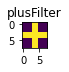

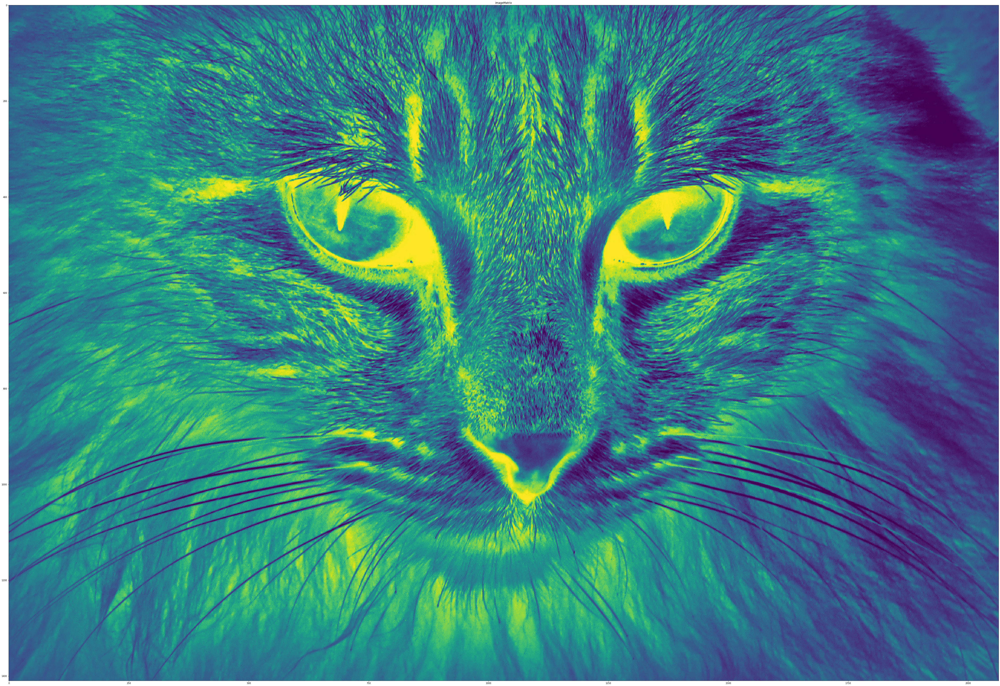

In [16]:
figure(figsize=(plusFilter.shape[0]/8, plusFilter.shape[0]/8))
plt.subplot(1, 2, 1)
plt.imshow(plusFilter, interpolation='nearest')
plt.title('plusFilter')

figure(figsize=(imageMatrix.shape[0]/8, imageMatrix.shape[0]/8))
plt.subplot(1, 2, 2)
plt.title('imageMatrix')
plt.imshow(imageMatrix, interpolation='nearest')
plt.show()
